## Trabajo 2: Clustering
### Máster Interuniversitario en Big Data: Tecnologías de Análisis de Datos Masivos
### Minería de datos - Curso 2023/2024

El alumno deberá resolver las cuestiones que se plantean. Una vez resueltas, deberá entregar el Jupyter Notebook con los comentarios en formato Markdown con el código incrustado y la salida en formato HTML, en la que quede reflejado el proceso de resolución seguido. Además de la corrección de las soluciones propuestas, se valorará la presentación de la memoria y la justificación a las decisiones tomadas. 

Los archivos que entregar se comprimirán en un fichero .ZIP con nombre ApellidosNombre.zip. El nombre de los alumnos que componen el grupo debe aparecer claramente identificados al principio de la memoria. 

### Conjunto de datos

En este trabajo se usarán 6 conjuntos de datos para analizar la capacidad de distintos algoritmos de agrupamiento: 

In [1]:
#pip install scikit-learn-extra

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from collections import Counter
#from sklearn

from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids

%matplotlib inline

In [3]:
path_data="./data/"

data1 = pd.read_csv(path_data+"data1.csv")
data2 = pd.read_csv(path_data+"data2.csv")
data3 = pd.read_csv(path_data+"data3.csv")
data4 = pd.read_csv(path_data+"data4.csv")
data5 = pd.read_csv(path_data+"data5.csv")
data6 = pd.read_csv(path_data+"data6.csv")

datos= [pd.read_csv(path_data+f"data{i}.csv") for i in range(1,7)]

Se puede observar que los datos están agrupados en distintas formas geométricas:

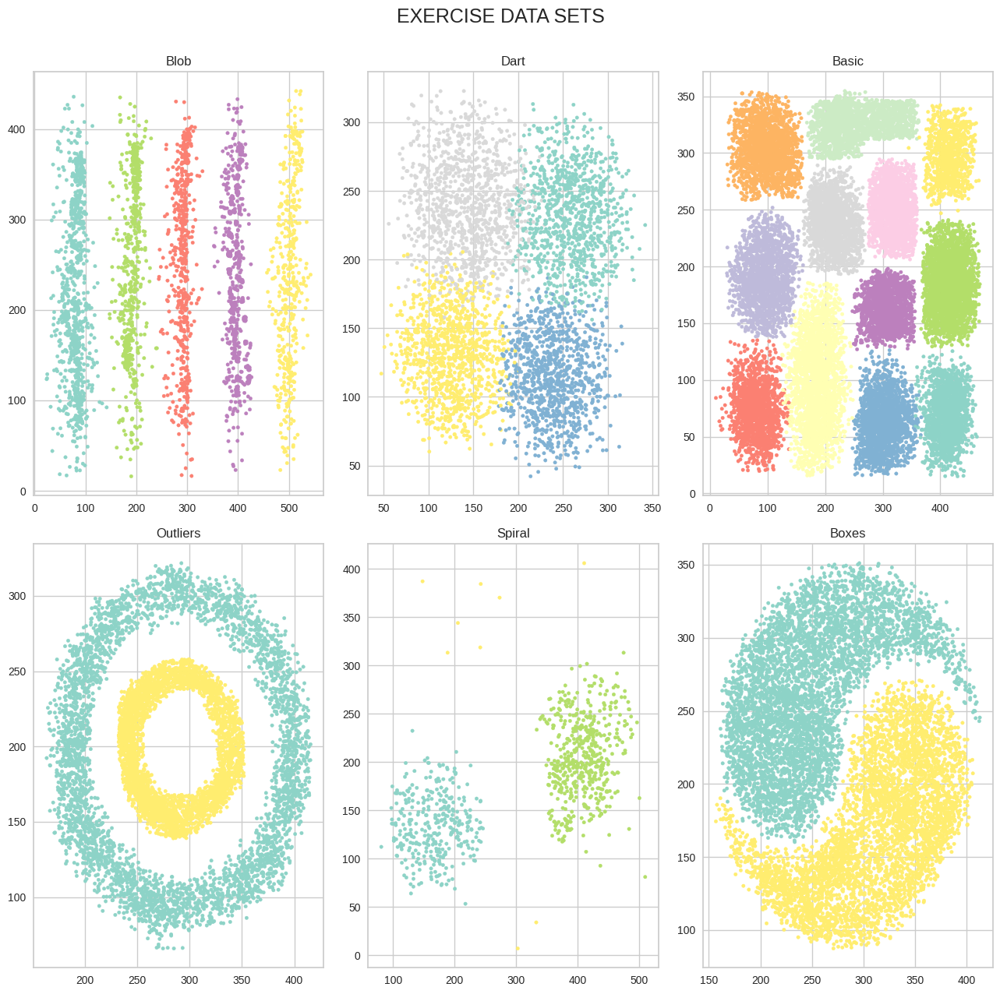

In [4]:
fig, axes = plt.subplots(nrows=2, ncols=3,figsize=(13,13))
fig.suptitle('EXERCISE DATA SETS\n', size = 18)

axes[0,0].scatter(data1['x'], data1['y'], c=data1['color'], s=10, cmap = "Set3")
axes[0,0].set_title("Blob");

axes[0,1].scatter(data2['x'], data2['y'], c=data2['color'], s=10, cmap = "Set3")
axes[0,1].set_title("Dart");

axes[0,2].scatter(data3['x'], data3['y'], c=data3['color'], s=10, cmap = "Set3")
axes[0,2].set_title("Basic");

axes[1,0].scatter(data4['x'], data4['y'], c=data4['color'], s=10, cmap = "Set3")
axes[1,0].set_title("Outliers");

axes[1,1].scatter(data5['x'], data5['y'], c=data5['color'], s=10, cmap = "Set3")
axes[1,1].set_title("Spiral");

axes[1,2].scatter(data6['x'], data6['y'], c=data6['color'], s=10, cmap = "Set3")
axes[1,2].set_title("Boxes");

plt.tight_layout()


### Ejercicio 1

Agrupa cada uno de los conjuntos de datos anteriores utilizando el k-medias (usa la implementación de scikit-learn). Optimiza la k utilizando el métodos del codo y el método Silhouette. 

Compara los resultados gráficamente respecto a los valores obtenidos por el conjunto de datos inicial. 

In [5]:
from scipy.signal import argrelextrema

def k_mean(data,metric='distortion',name='',max_iter=100):
    """
    Ags:
        metric, default: "distortion"

        Select the scoring metric to evaluate the clusters. The default is the mean distortion, defined by the sum of squared distances between each observation and its closest centroid. Other metrics include:

            distortion: mean sum of squared distances to centers

            silhouette: mean ratio of intra-cluster and nearest-cluster distance

            calinski_harabasz: ratio of within to between cluster dispersion


    """
    print(name)
    model = KMeans(max_iter=max_iter, init='random', n_init='auto', random_state=0)
    visualizer = KElbowVisualizer(model, k=(2,20), metric=metric)
    visualizer.fit(data)
    print(visualizer.elbow_value_)
    visualizer.show()
    if metric=="silhouette":
        maxima_indices = argrelextrema(np.array(visualizer.k_scores_), np.greater)
        print(maxima_indices)
        return visualizer.elbow_value_
    else:
        return visualizer.elbow_value_

In [6]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3192 entries, 0 to 3191
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       3192 non-null   float64
 1   y       3192 non-null   float64
 2   color   3192 non-null   int64  
dtypes: float64(2), int64(1)
memory usage: 74.9 KB


In [7]:
#j=2
#k_for_data['silhouette']=k_mean(datos[j],metric='silhouette',name=f"data_{j}_silhouette")

data_0_codo
6


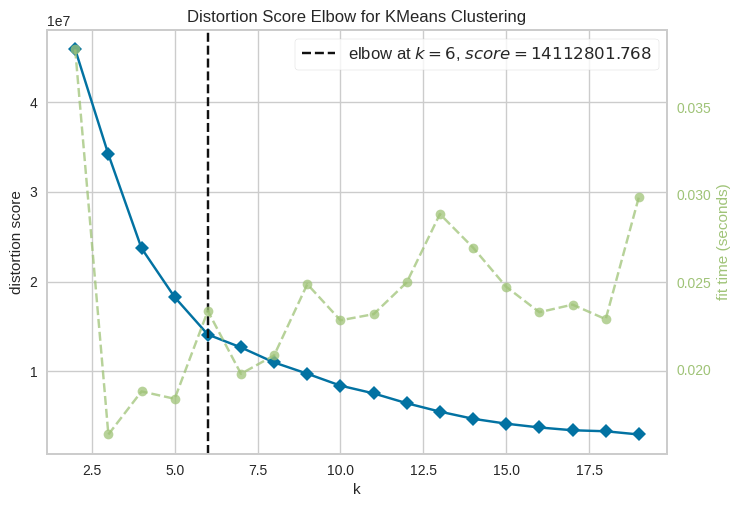

data_0_silhouette
2


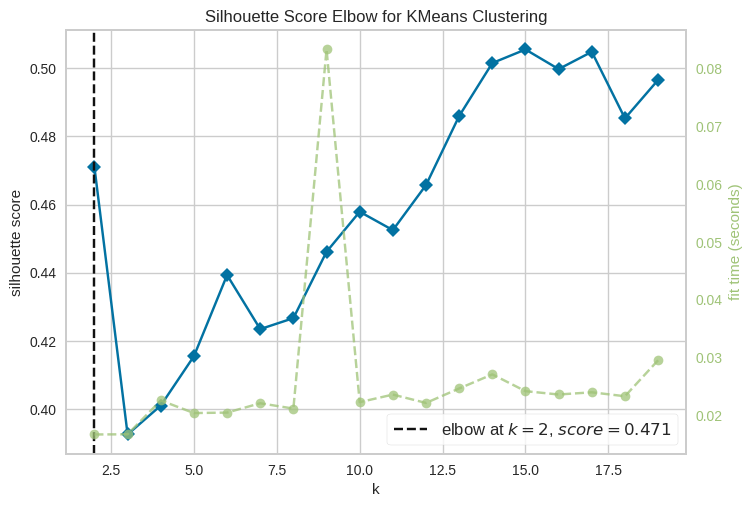

(array([ 4,  8, 13, 15]),)
{'codo': 6, 'silhouette': 2}
data_1_codo
4


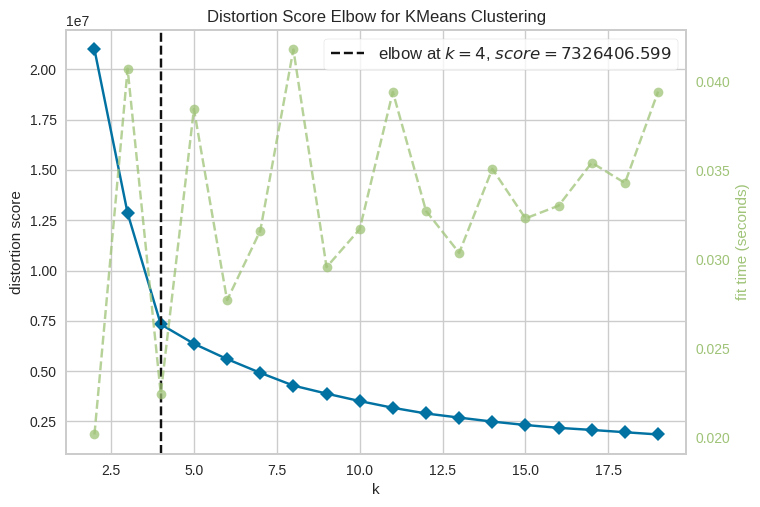

data_1_silhouette
4


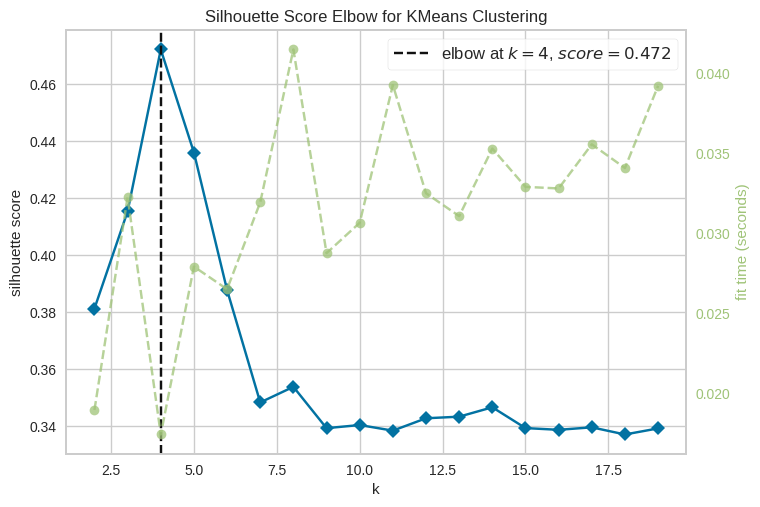

(array([ 2,  6,  8, 12, 15]),)
{'codo': 4, 'silhouette': 4}
data_2_codo
6


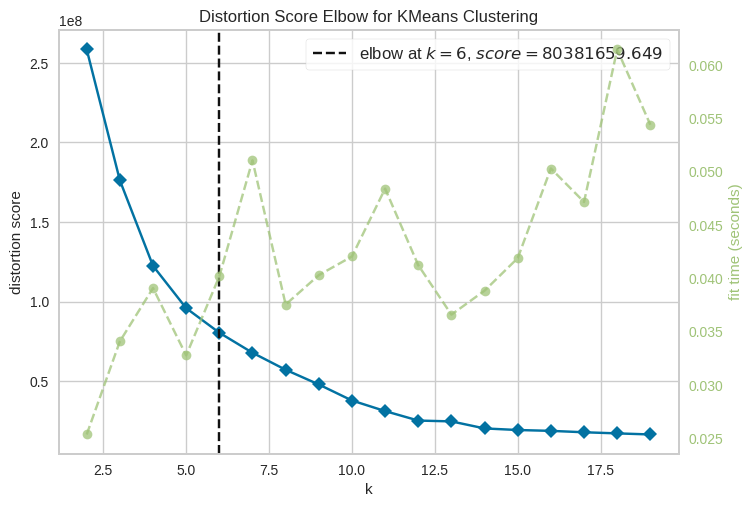

data_2_silhouette
2


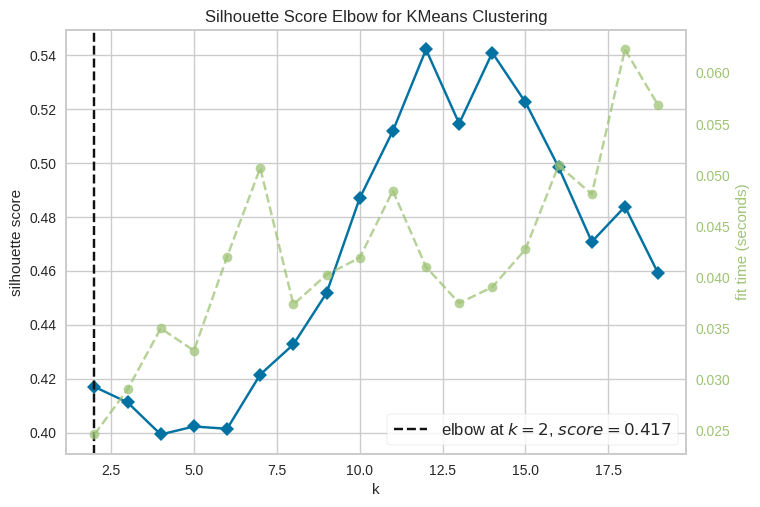

(array([ 3, 10, 12, 16]),)
{'codo': 6, 'silhouette': 2}
data_3_codo
5


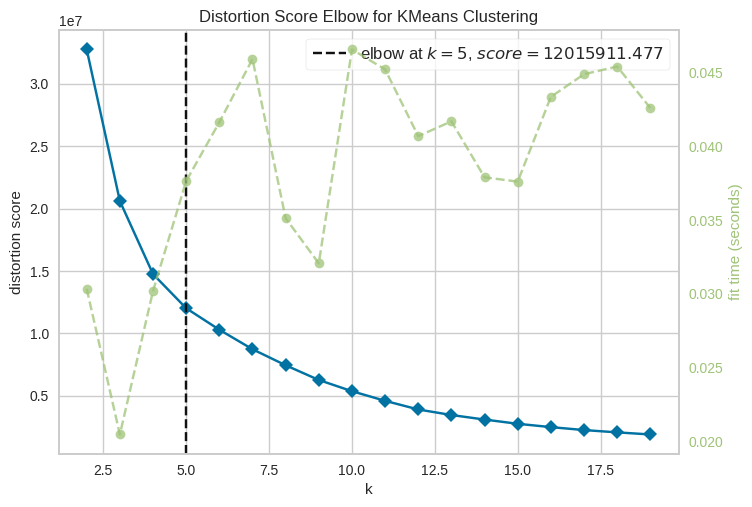

data_3_silhouette
3


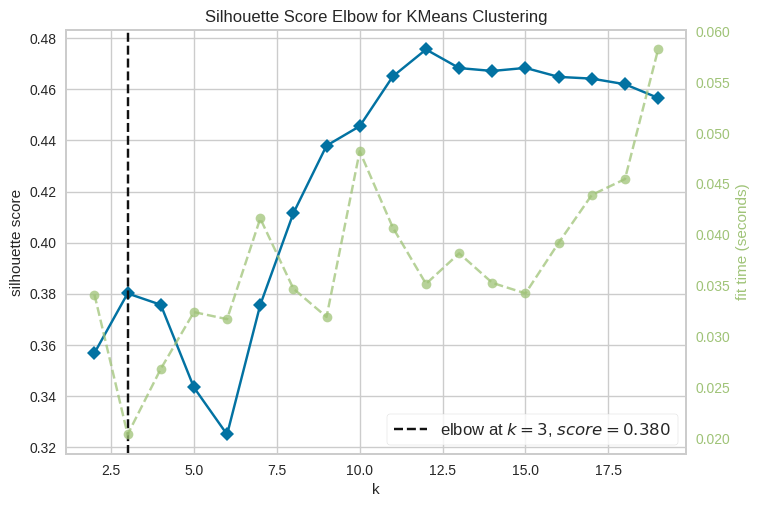

(array([ 1, 10, 13]),)
{'codo': 5, 'silhouette': 3}
data_4_codo
9


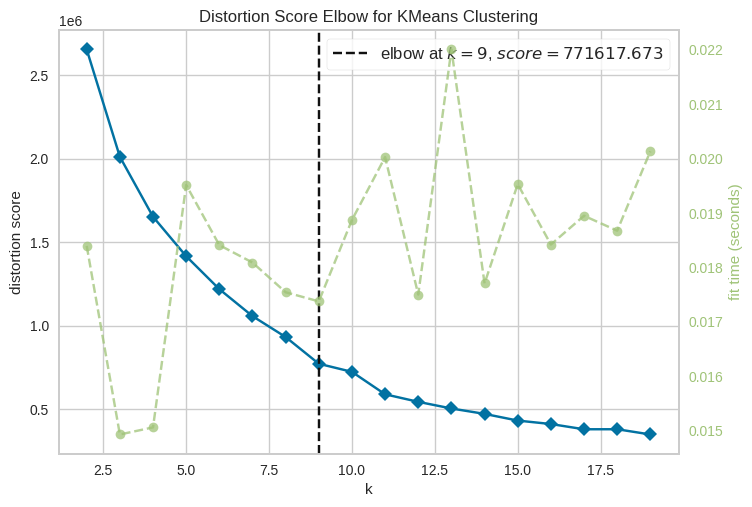

data_4_silhouette
2


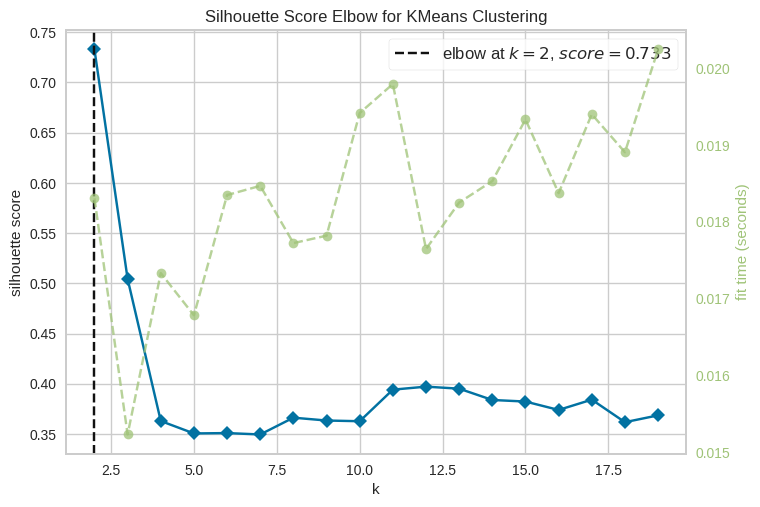

(array([ 4,  6, 10, 15]),)
{'codo': 9, 'silhouette': 2}
data_5_codo
5


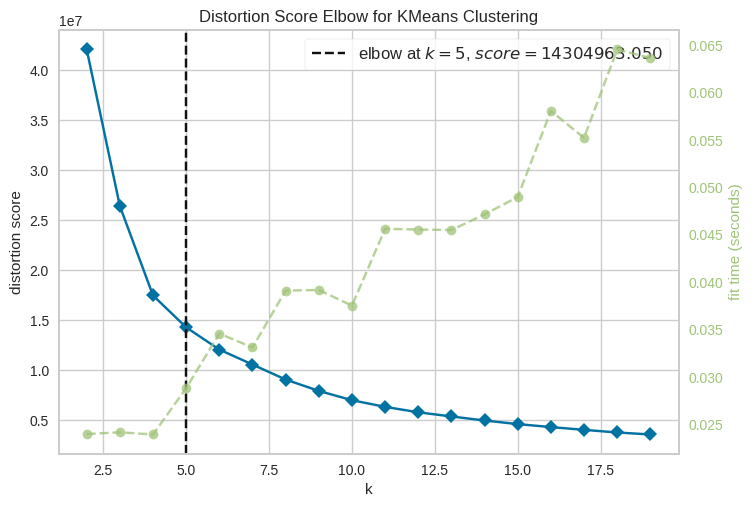

data_5_silhouette
4


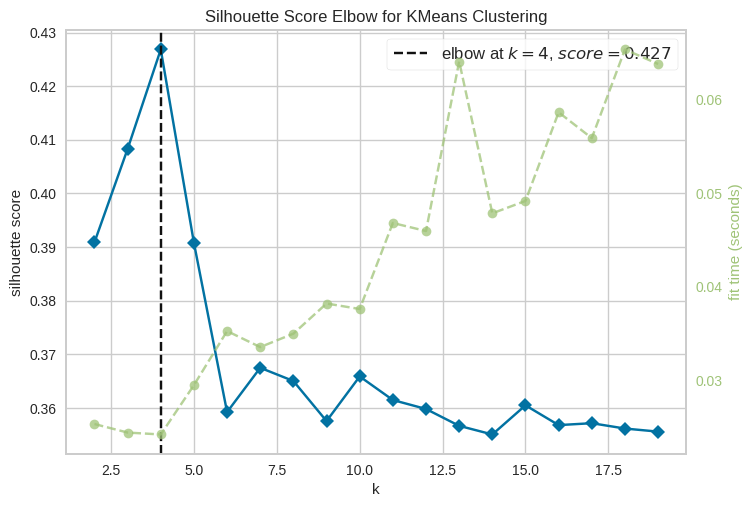

(array([ 2,  5,  8, 13, 15]),)
{'codo': 5, 'silhouette': 4}


In [8]:
data_with_k={}
for i,data in enumerate(datos):
    k_for_data={}
    k_for_data['codo']=k_mean(data,metric='distortion',name=f"data_{i}_codo")
    k_for_data['silhouette']=k_mean(data,metric='silhouette',name=f"data_{i}_silhouette")
    print(k_for_data)
    data_with_k[i]=k_for_data
    

In [9]:
def plot_k_means(data,k=2):
    model = KMeans(n_clusters=k, max_iter=100, init='random', n_init='auto', random_state=100).fit(data)
    
    data['Labels'] = model.labels_
    data['Labels'].value_counts()
    fig, axes = plt.subplots(1,1, figsize=(5,5))
    sns.scatterplot(x='x', y='y', data=data, hue='Labels', 
                palette=sns.color_palette('hls', k))
    
def plot_all_strategy(data,method={}):
    for key,k in method.items():
        print(key,k)
        plot_k_means(data,k=k)

# valores k correspondientes con el numero de colores

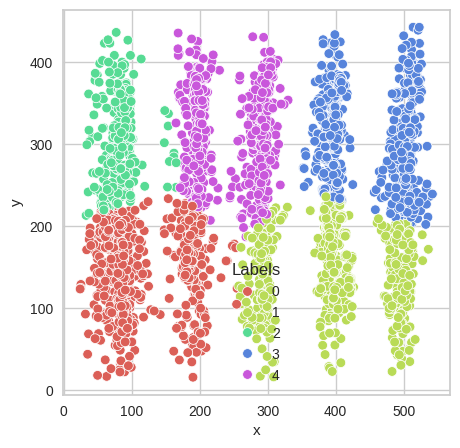

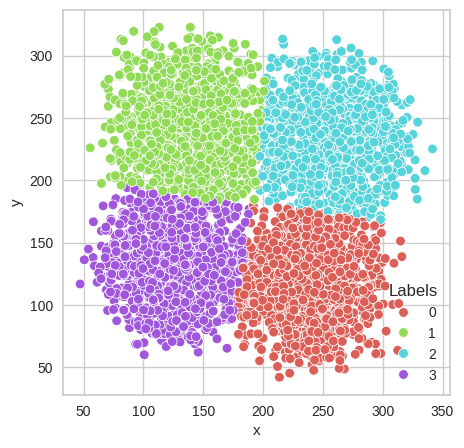

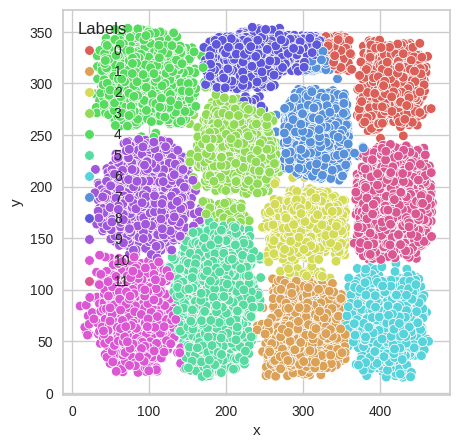

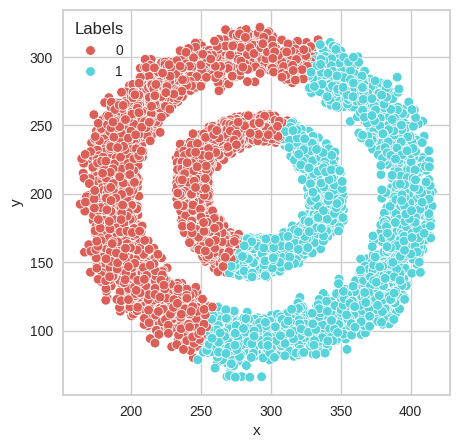

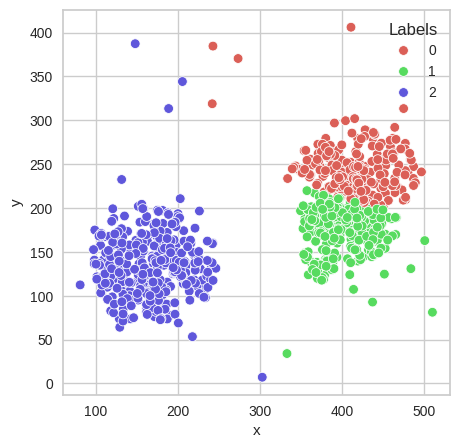

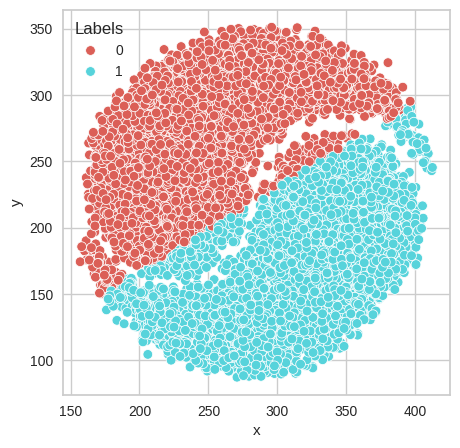

In [10]:
value_k=[5,4,12,2,3,2]
for i,data in enumerate(datos):
    plot_k_means(data.copy(),k=value_k[i])

# valores k correspondientes a KElbowVisualizer  para cada estrategia

codo 6
silhouette 2
codo 4
silhouette 4
codo 6
silhouette 2
codo 5
silhouette 3
codo 9
silhouette 2
codo 5
silhouette 4


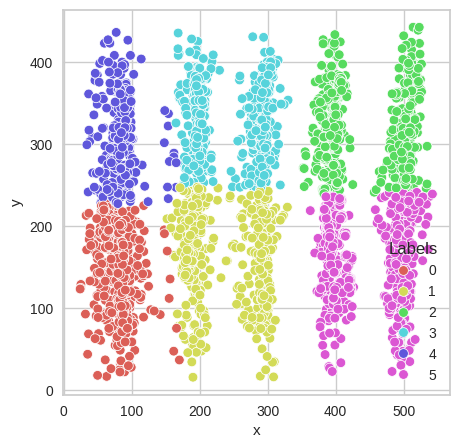

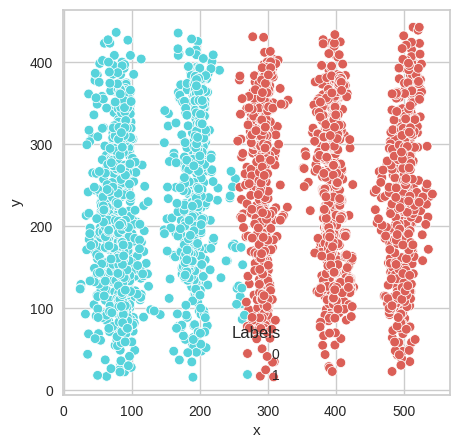

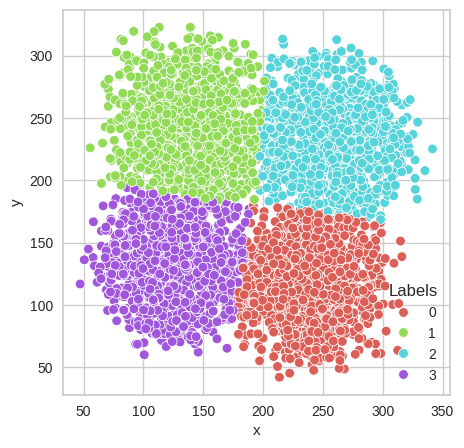

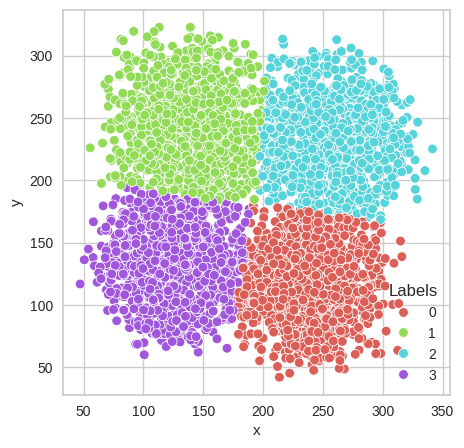

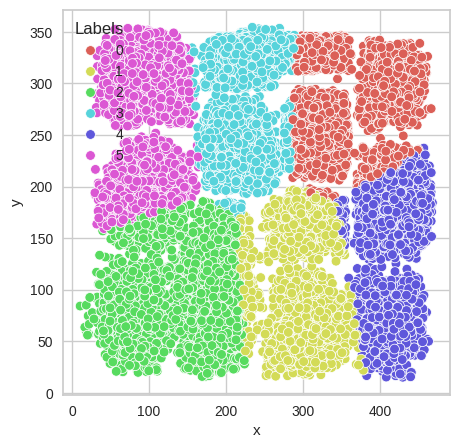

...

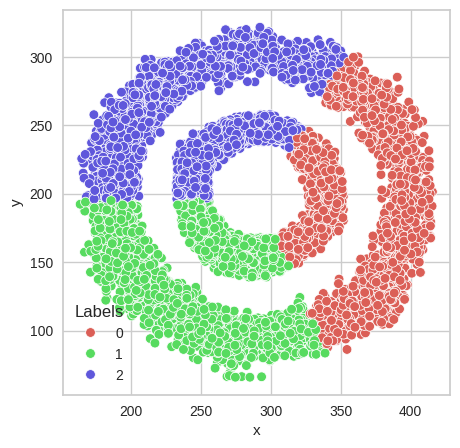

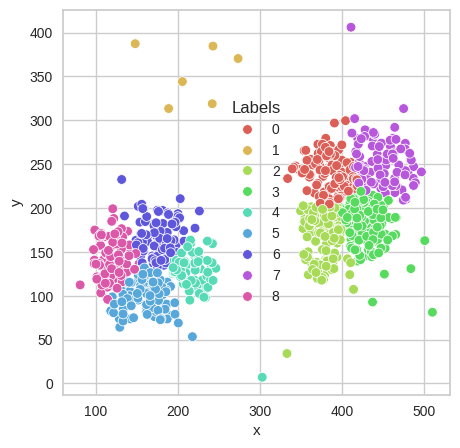

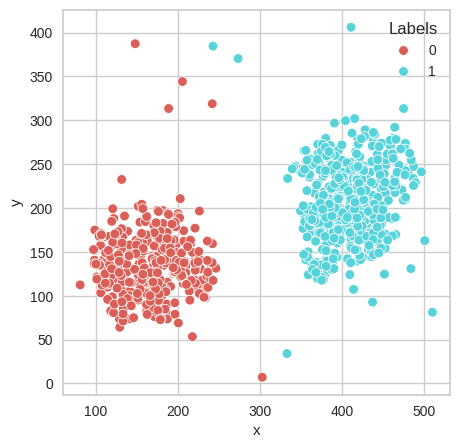

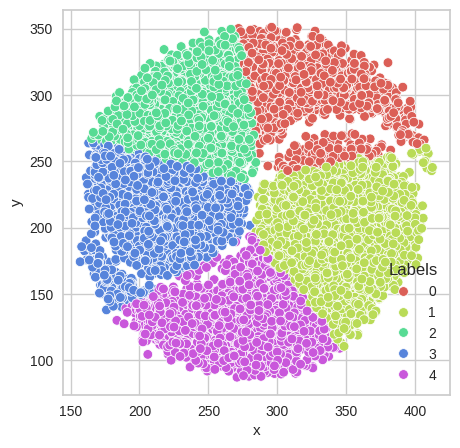

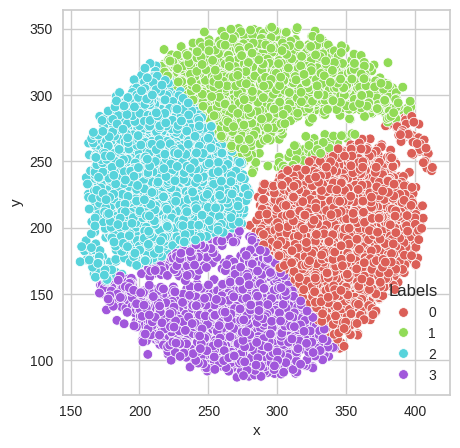

In [11]:
for i,data in enumerate(datos):
    plot_all_strategy(data.copy(),method=data_with_k[i])


# valores k a la grafica de  KElbowVisualizer para la estrategia de silhouette

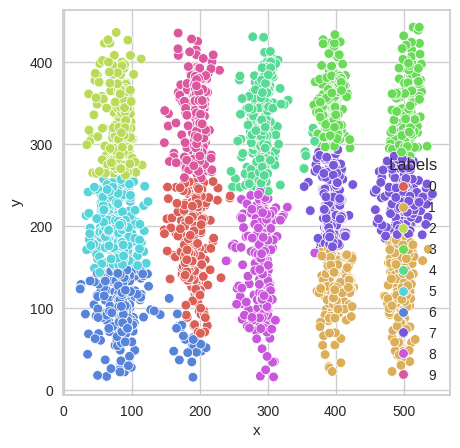

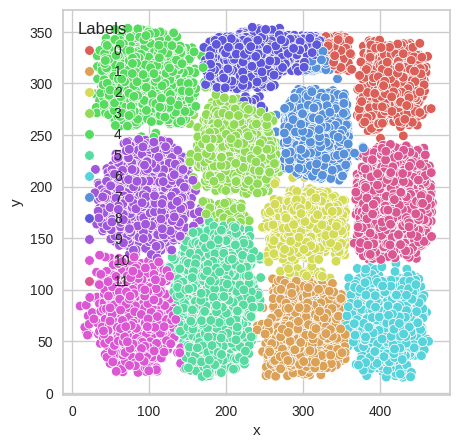

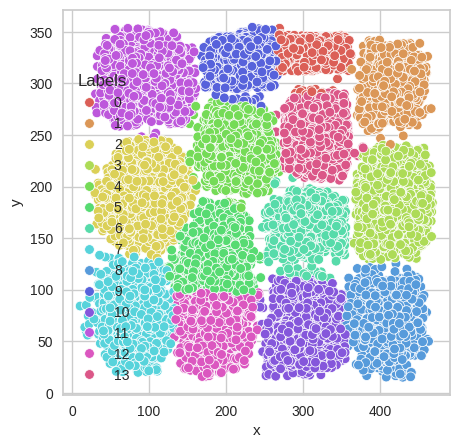

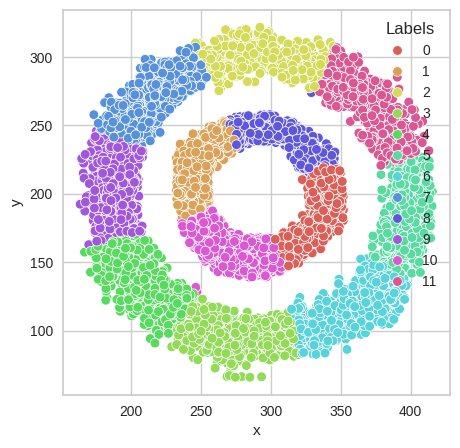

In [12]:
k_p=[[10],[],[12,14],[12],[],[]]

for i,data in enumerate(datos):
    for k in k_p[i]:
        plot_k_means(data.copy(),k=k)

### Ejercicio 2

Agrupa cada uno de los conjuntos de datos anteriores utilizando el k-medoides (usa la implementación de scikit-learn). 

Compara los resultados gráficamente respecto a los valores obtenidos por el conjunto de datos inicial. ¿En qué se diferencias los resultados de los obtenidos por el k-medias?

**Nota** nos dimos cuenta de que **tarda mas, considerablemente mas** que el k-means por lo que es interesante diferenciar por tiempos

In [13]:
def k_medoids(data,metric='distortion',name='',max_iter=100):
    """
    Ags:
        metric, default: "distortion"

        Select the scoring metric to evaluate the clusters. The default is the mean distortion, defined by the sum of squared distances between each observation and its closest centroid. Other metrics include:

            distortion: mean sum of squared distances to centers

            silhouette: mean ratio of intra-cluster and nearest-cluster distance

            calinski_harabasz: ratio of within to between cluster dispersion


    """
    print(name)
    model = KMedoids(max_iter=max_iter, init='random', random_state=0)
    visualizer = KElbowVisualizer(model, k=(2,20), metric=metric)
    visualizer.fit(data)
    print(visualizer.elbow_value_)
    visualizer.show()
    if metric=="silhouette":
        maxima_indices = argrelextrema(np.array(visualizer.k_scores_), np.greater)
        print(maxima_indices)
        return visualizer.elbow_value_
    else:
        return visualizer.elbow_value_

data_0_codo
6


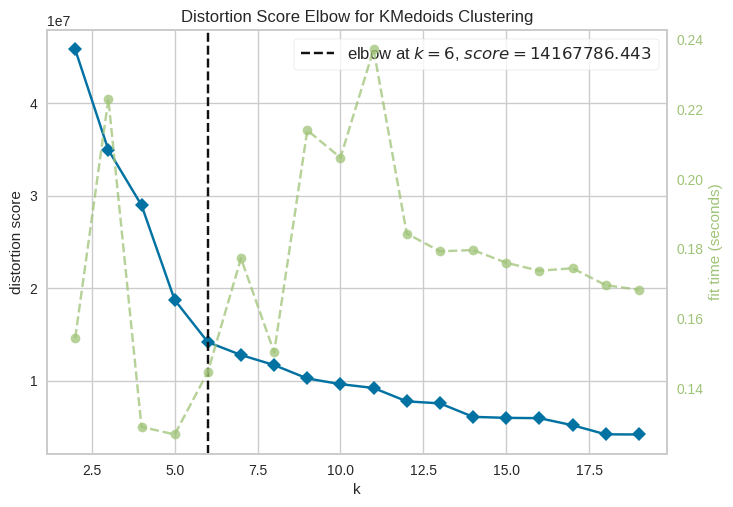

data_0_silhouette
2


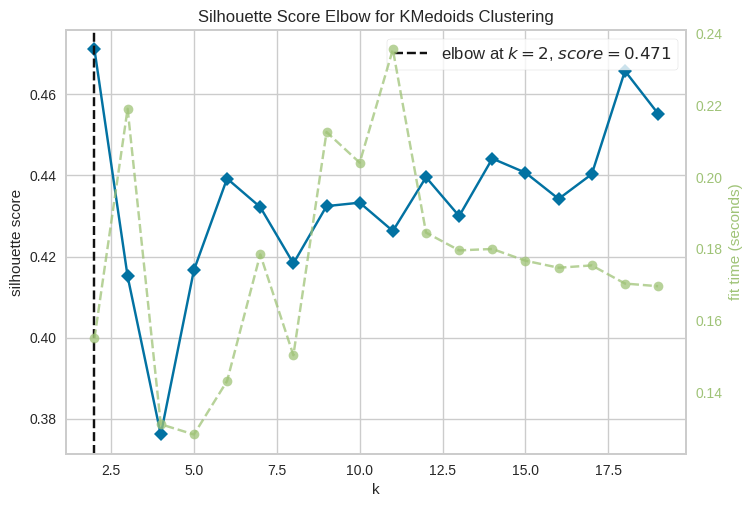

(array([ 4,  8, 10, 12, 16]),)
{'codo': 6, 'silhouette': 2}
data_1_codo
4


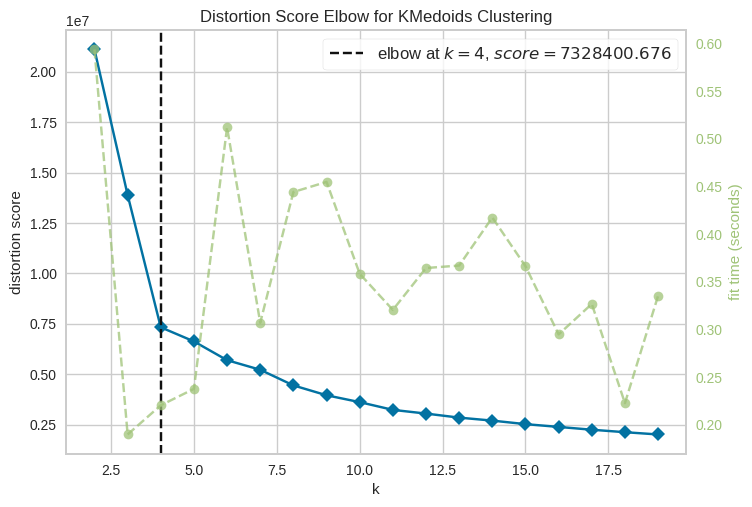

data_1_silhouette
2


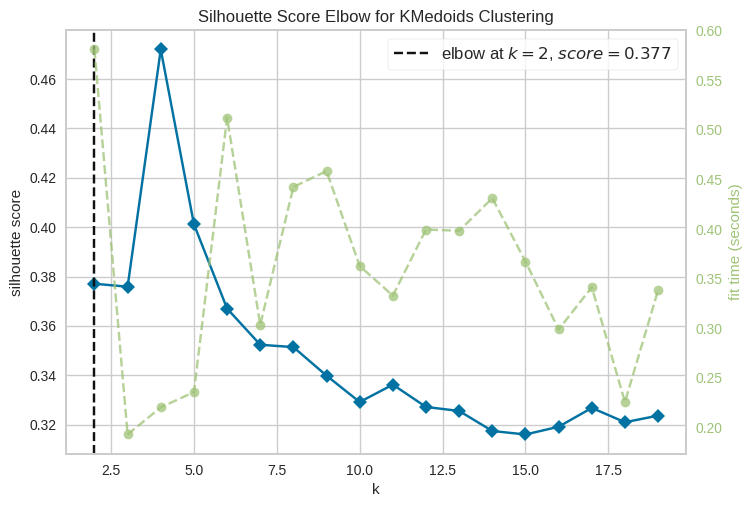

(array([ 2,  9, 15]),)
{'codo': 4, 'silhouette': 2}
data_2_codo
5


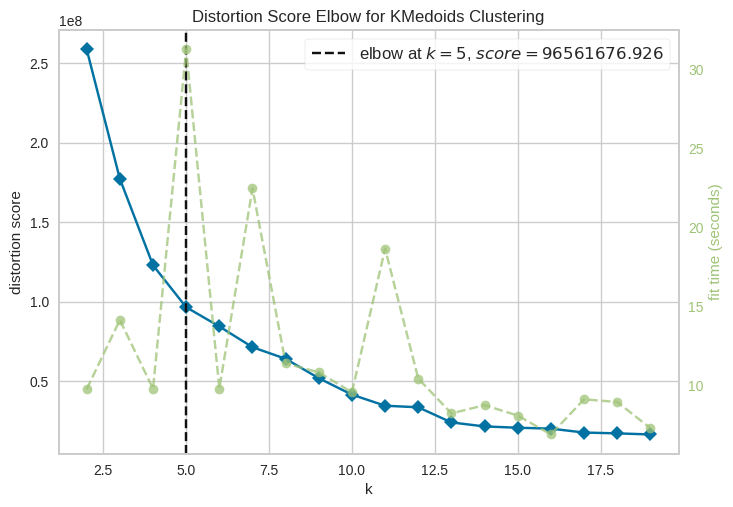

data_2_silhouette
2


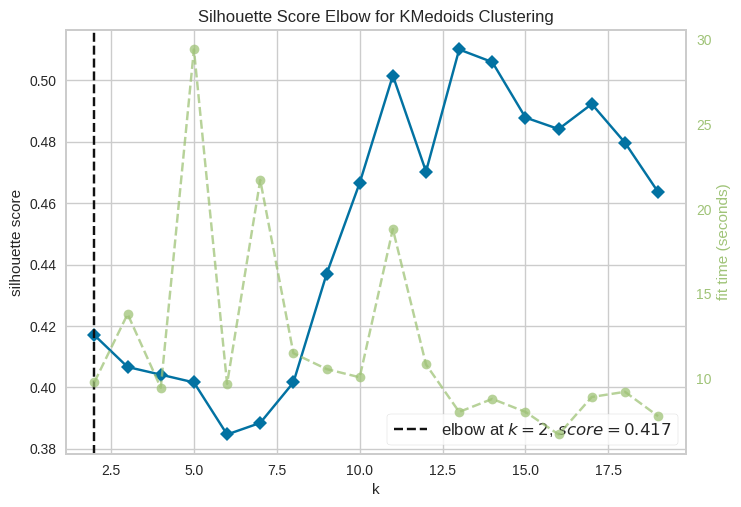

(array([ 9, 11, 15]),)
{'codo': 5, 'silhouette': 2}
data_3_codo
7


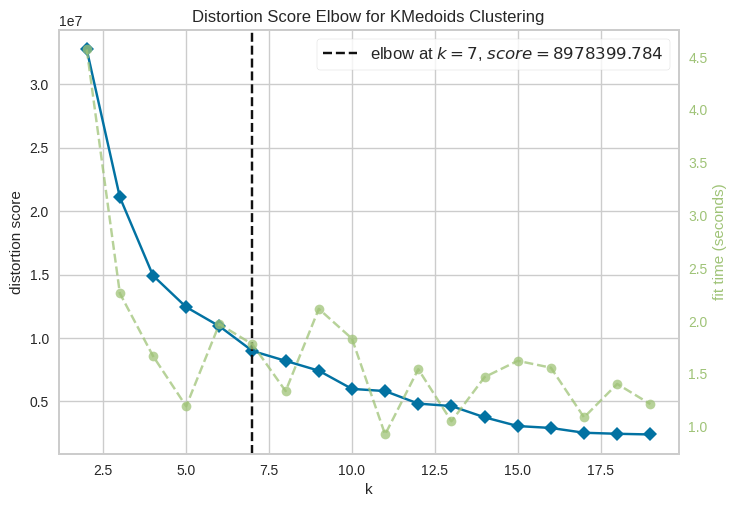

data_3_silhouette
3


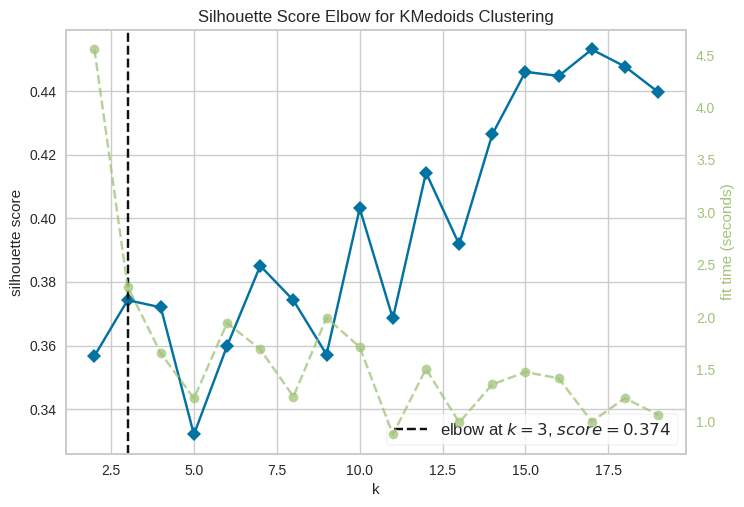

(array([ 1,  5,  8, 10, 13, 15]),)
{'codo': 7, 'silhouette': 3}
data_4_codo
8


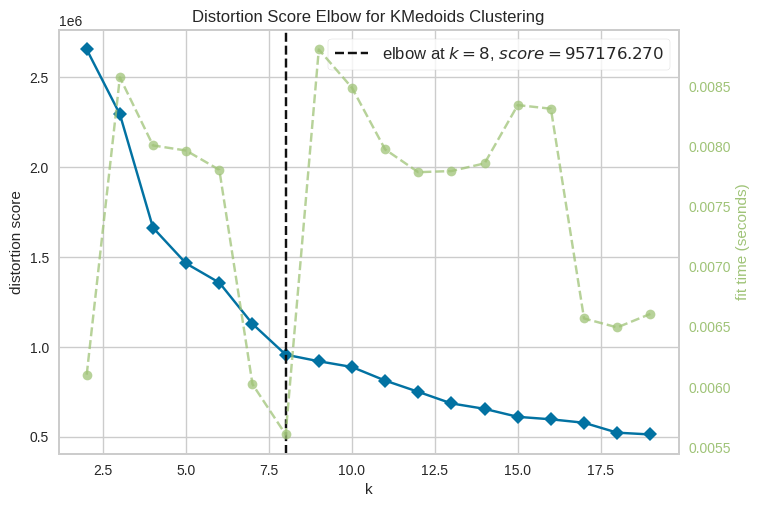

data_4_silhouette
2


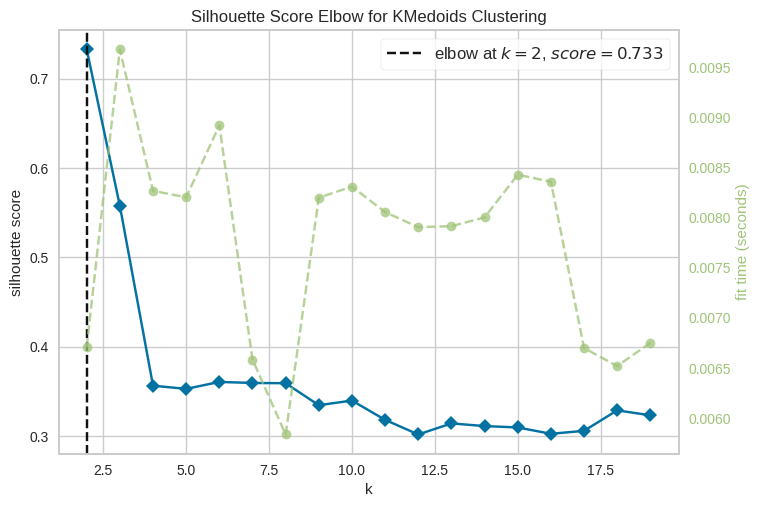

(array([ 4,  8, 11, 16]),)
{'codo': 8, 'silhouette': 2}
data_5_codo
5


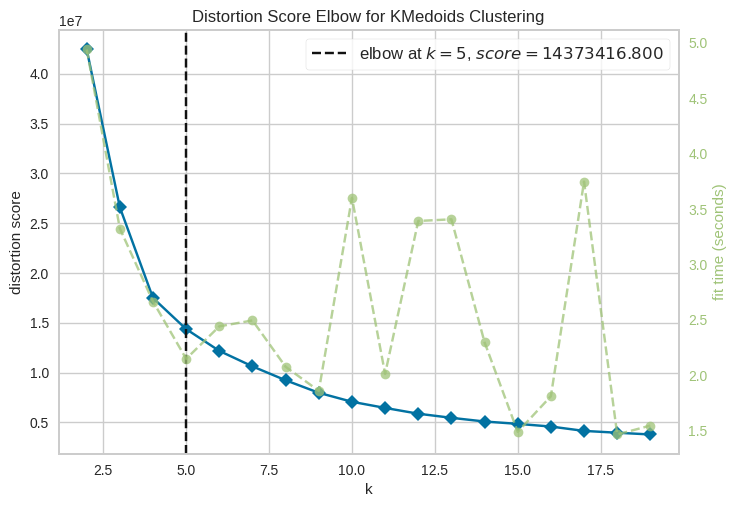

data_5_silhouette
4


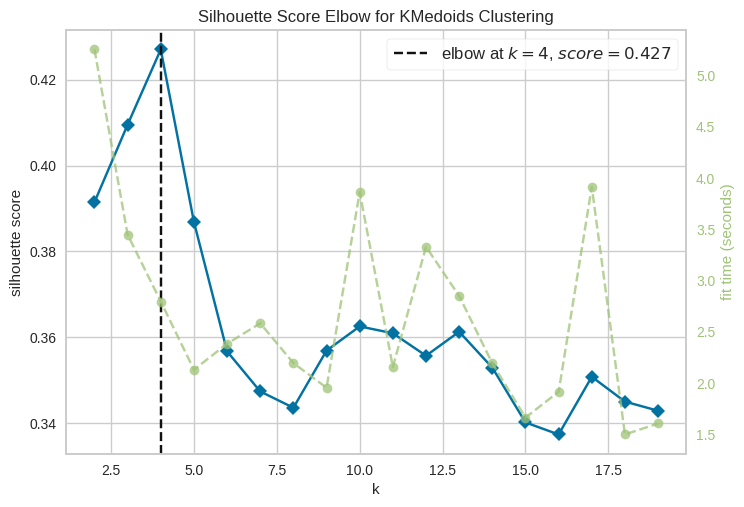

(array([ 2,  8, 11, 15]),)
{'codo': 5, 'silhouette': 4}


In [14]:
data_with_k={}
for i,data in enumerate(datos):
    k_for_data={}
    k_for_data['codo']=k_medoids(data,metric='distortion',name=f"data_{i}_codo")
    k_for_data['silhouette']=k_medoids(data,metric='silhouette',name=f"data_{i}_silhouette")
    print(k_for_data)
    data_with_k[i]=k_for_data
    

In [15]:
def plot_k_medoids(data,k=2):
    model = KMedoids(n_clusters=k, max_iter=100, init='random', random_state=100).fit(data)
    
    data['Labels'] = model.labels_
    data['Labels'].value_counts()
    fig, axes = plt.subplots(1,1, figsize=(5,5))
    sns.scatterplot(x='x', y='y', data=data, hue='Labels', 
                palette=sns.color_palette('hls', k))
    
def plot_all_strategy_medoids(data,method={}):
    for key,k in method.items():
        print(key,k)
        plot_k_medoids(data,k=k)

# valores k correspondientes con el numero de colores

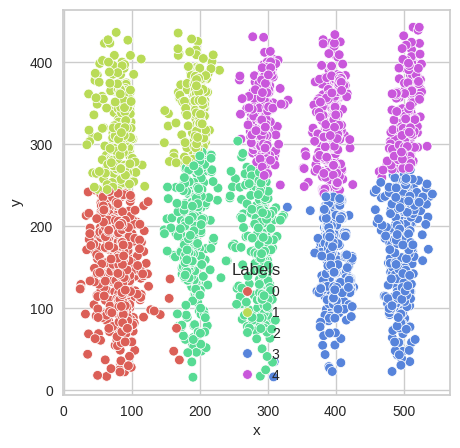

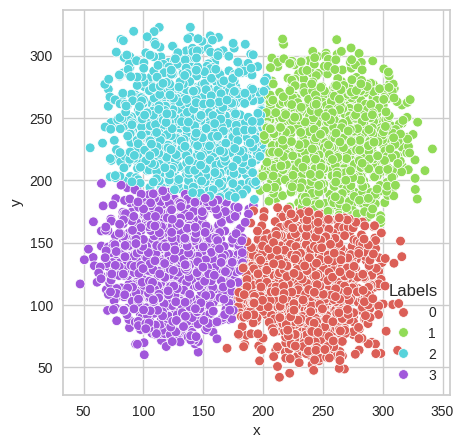

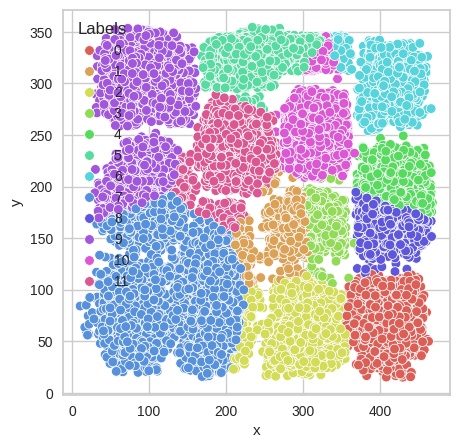

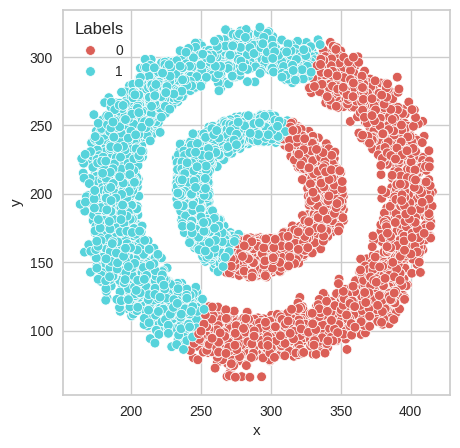

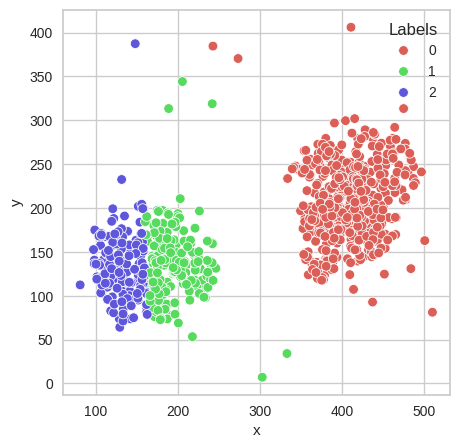

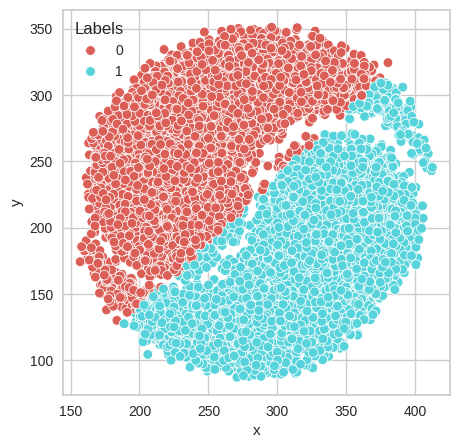

In [16]:
value_k=[5,4,12,2,3,2]
for i,data in enumerate(datos):
    plot_k_medoids(data.copy(),k=value_k[i])

# valores k correspondientes a KElbowVisualizer  para cada estrategia

codo 6
silhouette 2
codo 4
silhouette 2
codo 5
silhouette 2
codo 7
silhouette 3
codo 8
silhouette 2
codo 5
silhouette 4


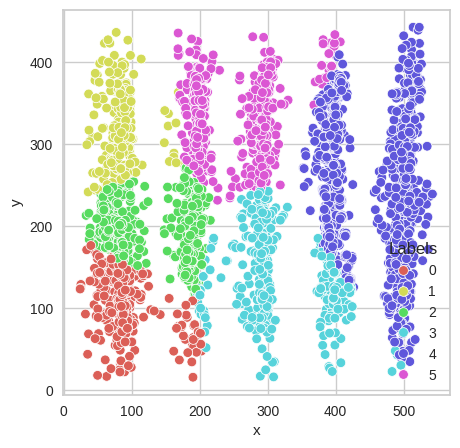

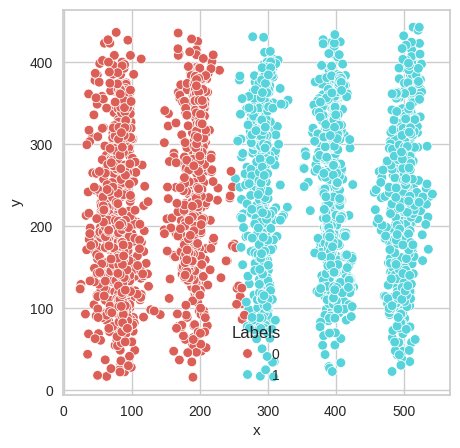

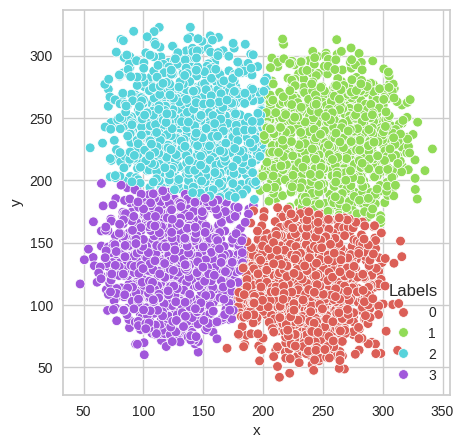

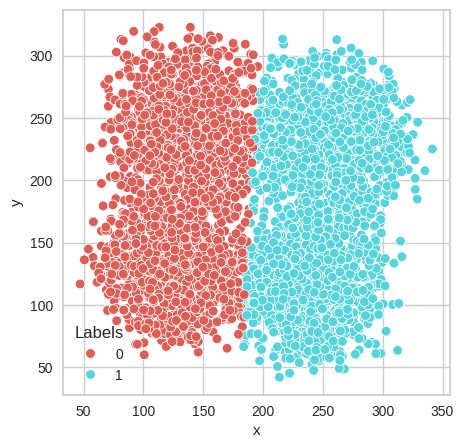

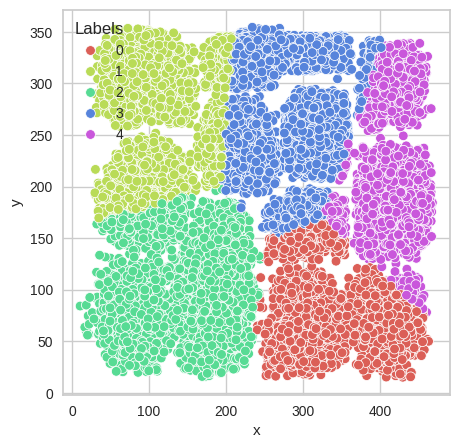

...

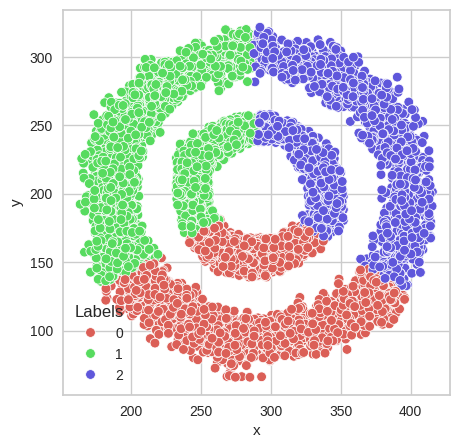

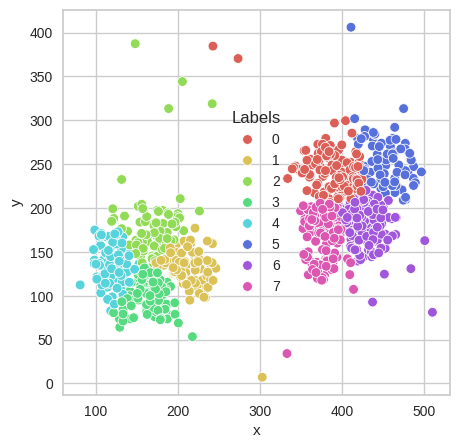

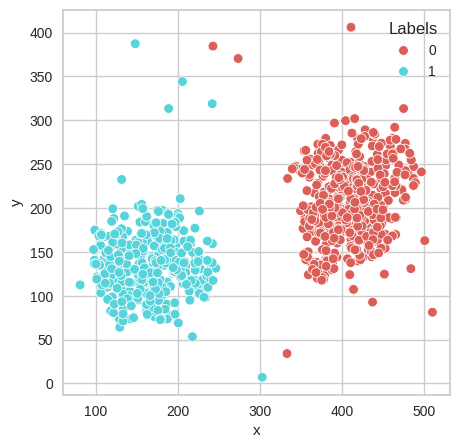

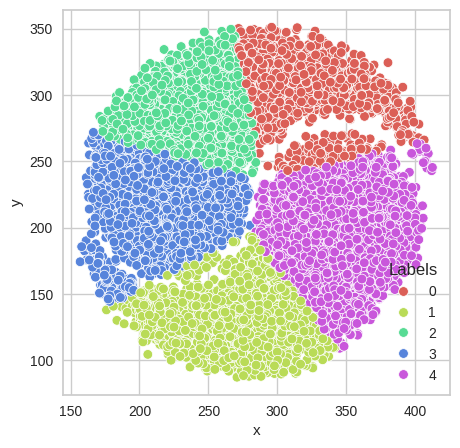

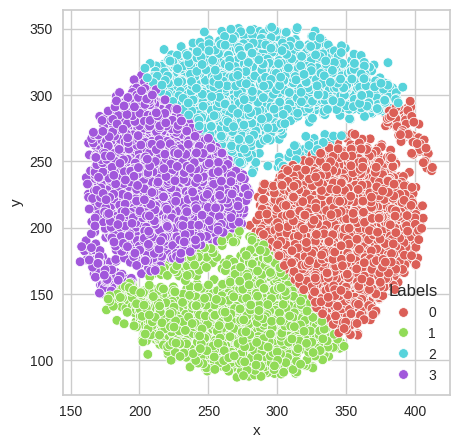

In [17]:
for i,data in enumerate(datos):
    plot_all_strategy_medoids(data.copy(),method=data_with_k[i])

# valores k a la grafica de  KElbowVisualizer para la estrategia de silhouette

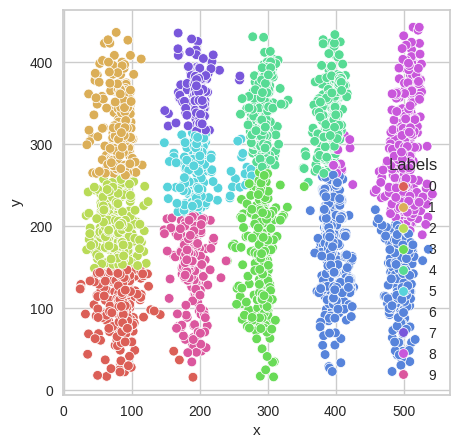

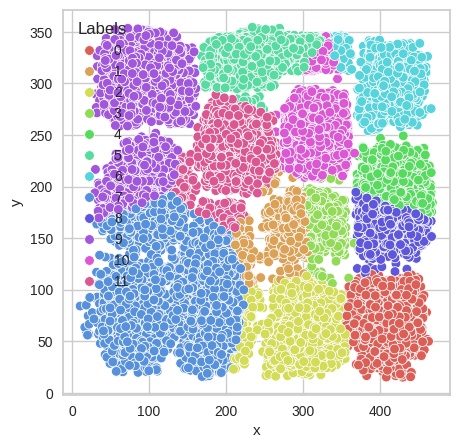

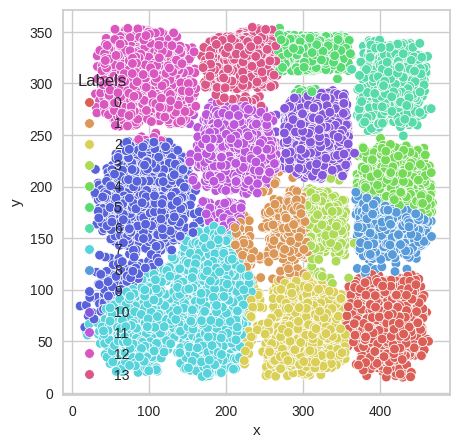

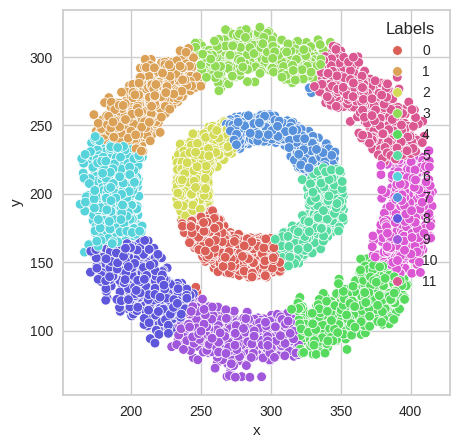

In [18]:
k_p=[[10],[],[12,14],[12],[],[]]

for i,data in enumerate(datos):
    for k in k_p[i]:
        plot_k_medoids(data.copy(),k=k)

### Ejercicio 3

[DBScan](https://nzlul.medium.com/clustering-method-using-k-means-hierarchical-and-dbscan-using-python-5ca5721bbfc3)

Agrupa cada uno de los conjuntos de datos anteriores utilizando el DBScan (usa la implementación de scikit-learn). Optimiza el valor de epsilon utilizando la regla del codo en un gráfico de k-distancias a los vecinos. Recuerda que el codo representa el punto donde la tasa de cambio de la distancia media de los k-vecinos más cercanos comienza a disminuir significativamente. Este punto se considera como un indicador del valor óptimo de epsilon. Fija MinPts a 4 (2 x dimensiones).


Compara los resultados gráficamente respecto a los valores obtenidos por el conjunto de datos inicial. ¿Mejoran los resultados del k-medias y del k-medoides?

In [19]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN


In [20]:
def plot_k_distances(data, min_pts=4):
    """
    Calcula y grafica las distancias al k-ésimo vecino más cercano para cada punto en el conjunto de datos.
    
    Args:
        data: Conjunto de datos a analizar.
        min_pts: Número de puntos mínimos para considerar en la vecindad de un punto.
    """
    # Calcula las distancias al k-ésimo vecino más cercano
    neigh = NearestNeighbors(n_neighbors=min_pts)
    neigh.fit(data)
    distances, indices = neigh.kneighbors(data)
    
    # Ordena las distancias
    distances = np.sort(distances[:, -1], axis=0)
    
    # Grafica las distancias
    plt.figure(figsize=(12, 6))
    plt.plot(distances)
    plt.title(f'Distancia al {min_pts}-ésimo vecino más cercano')
    plt.xlabel('Punto')
    plt.ylabel(f'Distancia al {min_pts}-ésimo vecino')
    plt.show()

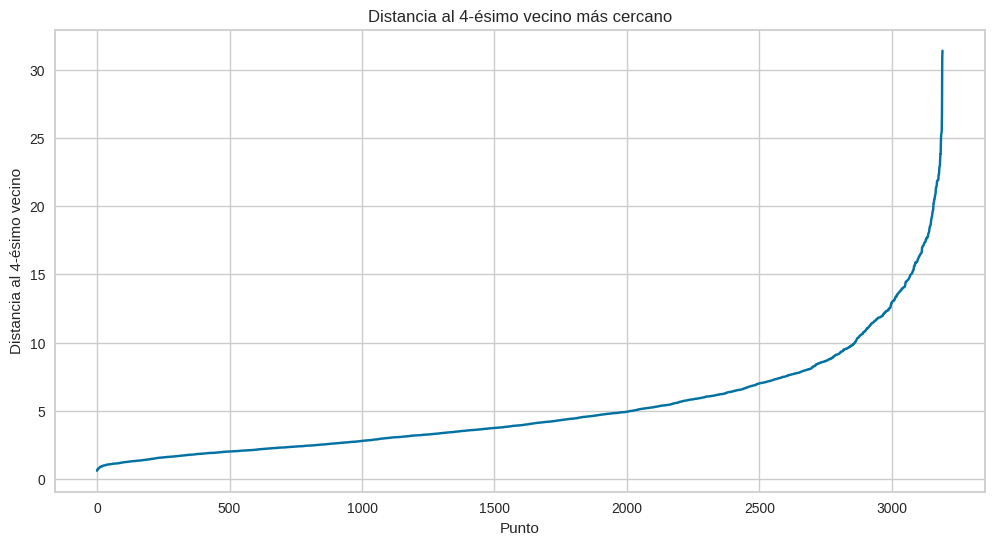

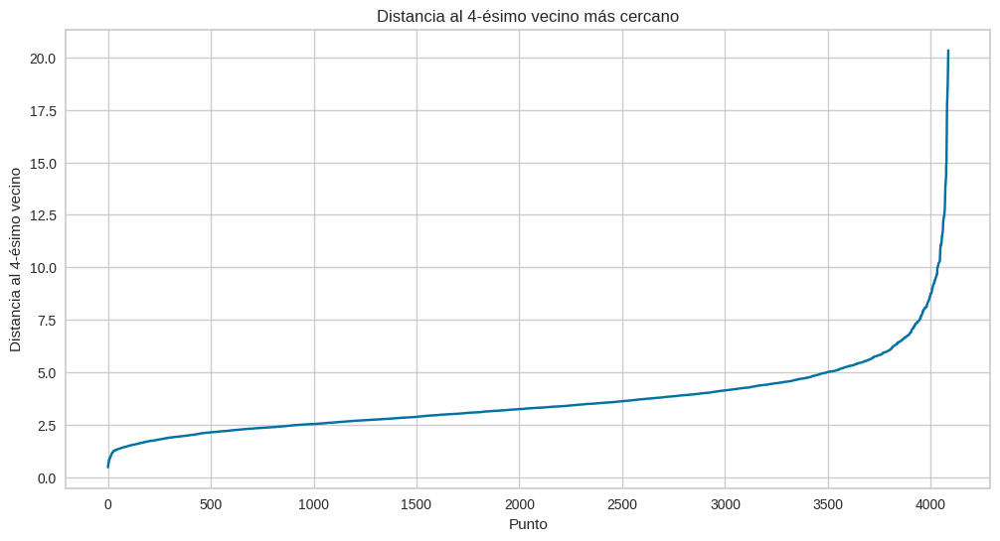

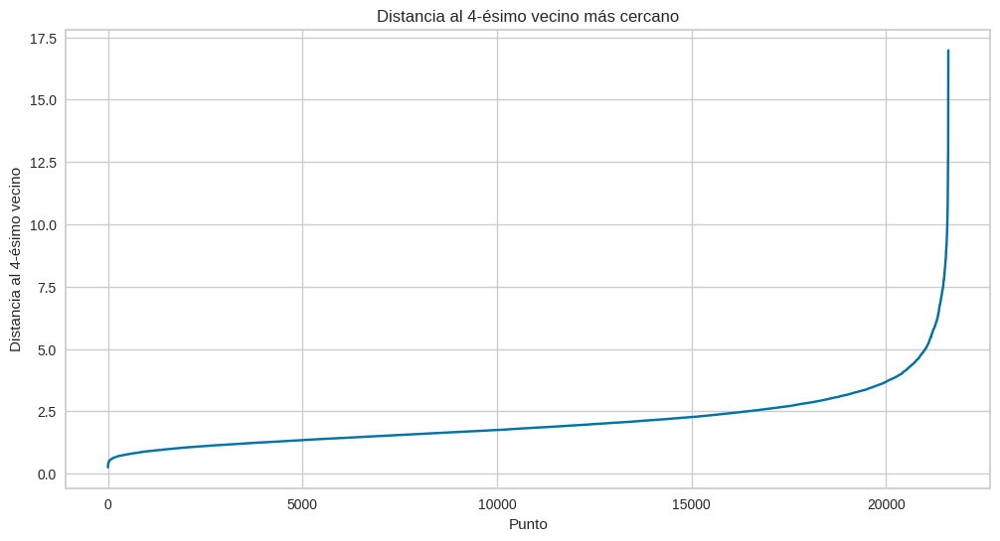

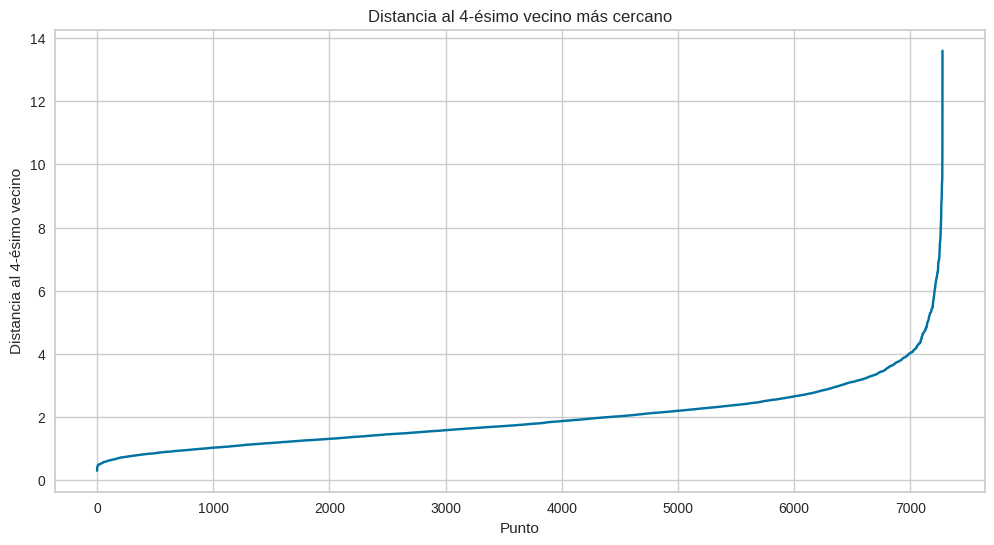

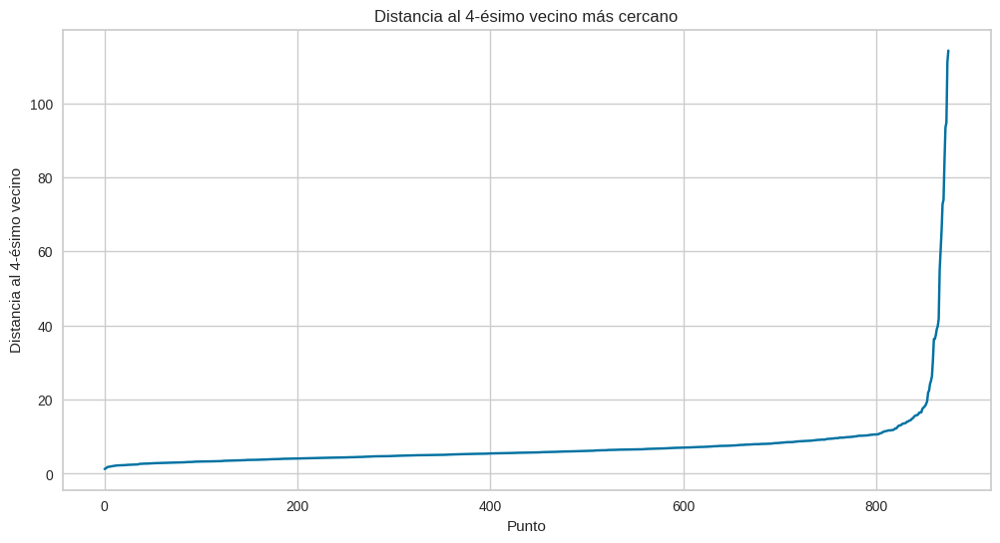

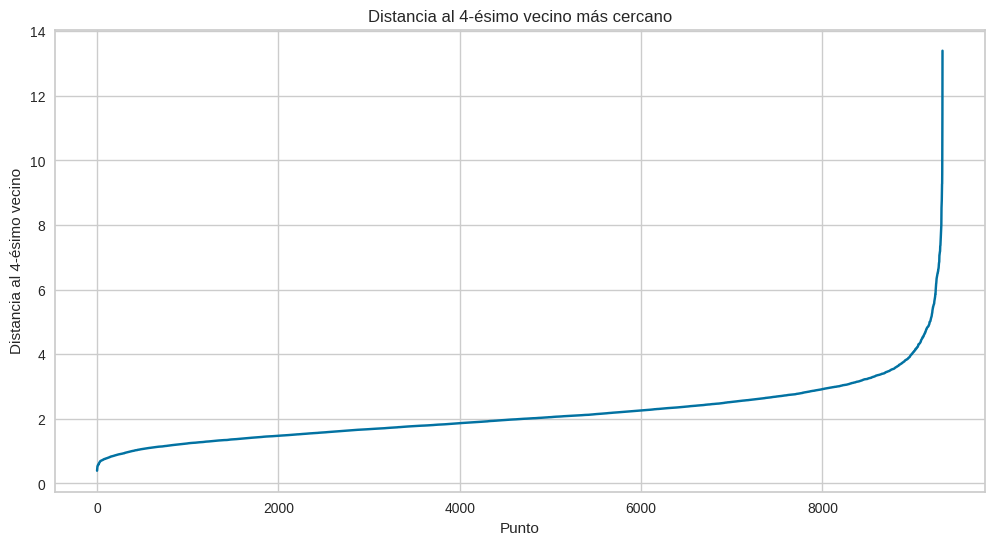

In [21]:
for i,data in enumerate(datos):
    plot_k_distances(data)

In [22]:

def plot_DBSCAN(data,eps=2,min_pts=4):
    model  = DBSCAN(eps=eps, min_samples=min_pts).fit(data)
    
    data['Labels'] = model.labels_
    data['Labels'].value_counts()
    fig, axes = plt.subplots(1,1, figsize=(5,5))
    sns.scatterplot(x='x', y='y', data=data, hue='Labels', 
                palette=sns.color_palette('hls', eps))
    
def plot_all_strategy_DBSCAN(data,method={}):
    for key,k in method.items():
        print(key,k)
        plot_k_medoids(data,k=k)

/tmp/ipykernel_7185/2215446909.py:7: UserWarning: 
The palette list has fewer values (5) than needed (105) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x='x', y='y', data=data, hue='Labels',
/tmp/ipykernel_7185/2215446909.py:7: UserWarning: 
The palette list has fewer values (4) than needed (128) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x='x', y='y', data=data, hue='Labels',
/tmp/ipykernel_7185/2215446909.py:7: UserWarning: The palette list has more values (12) than needed (2), which may not be intended.
  sns.scatterplot(x='x', y='y', data=data, hue='Labels',
/tmp/ipykernel_7185/2215446909.py:7: UserWarning: 
The palette list has fewer values (2) than needed (326) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(x='x', y='y', data=data, hue='Labels',
/tmp/ipykernel_7185/2215446909.py:7: UserWarning: 
The palette list has fewer values (3) than needed (25) and will cycle, which may produce an

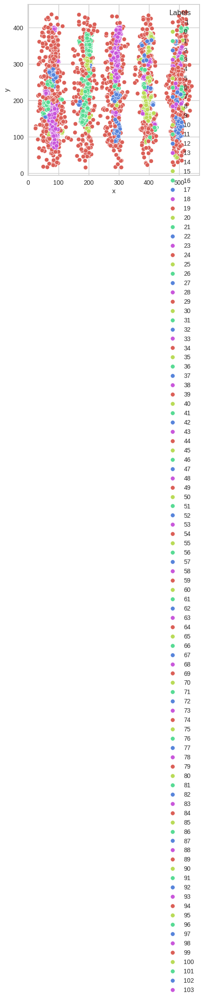

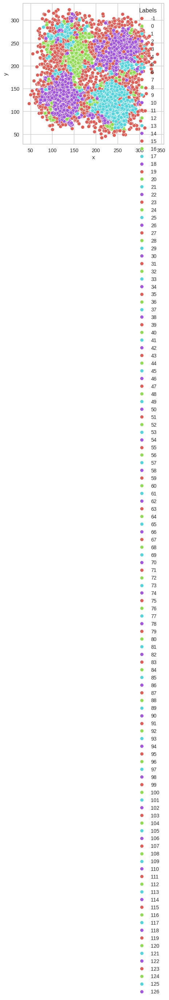

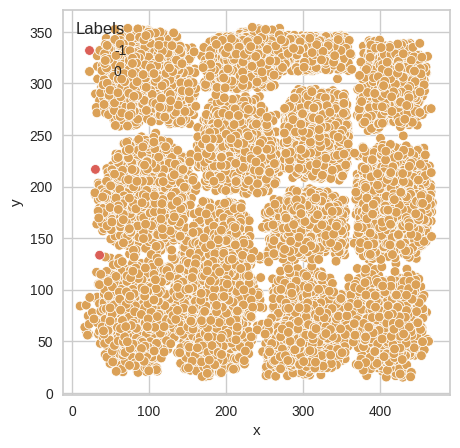

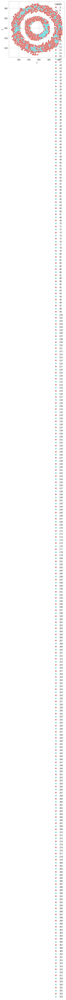

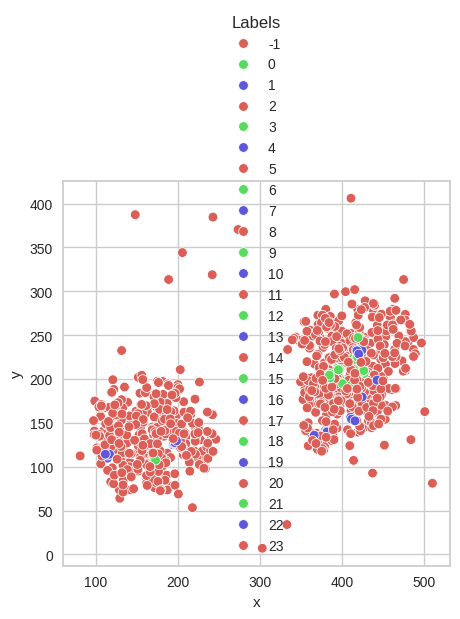

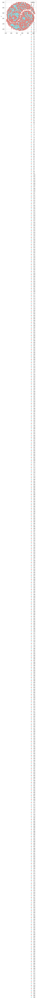

In [23]:
value_eps=[5,4,12,2,3,2]
for i,data in enumerate(datos):
    plot_DBSCAN(data.copy(),eps=value_eps[i])

## Notas profesor
Idea cargar datos hacer fitting y ver que os da y comparar con los resultar ver como se aproxima el clustering a los graficaos que muestra delante conjuntos de datos k melodies , y practicamente llegar a vuestras conclusiones.
